## Marjanovic, Hofree, Chan et al Cancer Cell 2020 Analysis using SCANPY
5/14/2023 - Data generated from Cancer Cell 2020 paper, transformed into an anndata object by Jonathan Rub
Analyze global run and create h5_ad files for further analysis
2/24/23 Analyze for signatures of cancer cell clusters - no regression

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc

import math
import matplotlib as plt
import anndata
from pathlib import Path

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_93199/2600238561.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams["font.family"] = "Arial"
#plt.rcParams['figure.figsize'] = (3,4)

In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.8 anndata==0.10.5.post1 umap==0.5.5 numpy==1.26.3 scipy==1.12.0 pandas==2.2.0 scikit-learn==1.4.0 statsmodels==0.14.1 igraph==0.11.3 pynndescent==0.5.11


In [4]:
#Path("./figures").mkdir(parents=True, exist_ok=True) # generate figures here
Path("./write").mkdir(parents=True, exist_ok=True) # write h5ad here

In [5]:
results_file = './write/Marjanovic_et_al_LUAD_data.h5ad'  # the file that will store the analysis results

Read in the count matrix into an [`AnnData`](https://anndata.readthedocs.io/en/latest/anndata.AnnData.html) object, which holds many slots for annotations and different representations of the data. It also comes with its own HDF5 file format: `.h5ad`.

In [6]:
adata = sc.read_h5ad('luadAdata.h5ad')           

In [7]:
adata.var_names_make_unique()  # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`

In [8]:
adata.obs['clusterK12'] = adata.obs.clusterK12.astype('category')

## Preprocessing

normalizing counts per cell
    finished (0:00:00)


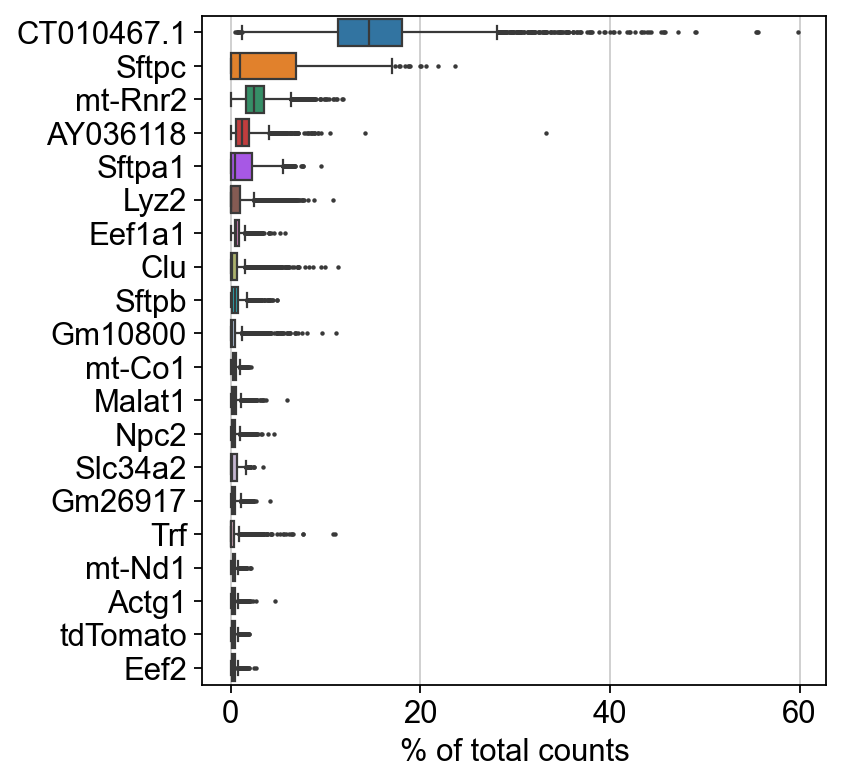

In [9]:
sc.pl.highest_expr_genes(adata, n_top=20, )

Basic filtering:

In [10]:
sc.pp.filter_cells(adata, min_genes=300)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 18831 genes that are detected in less than 3 cells


In [11]:
adata.var['mt'] = adata.var_names.str.startswith('mt-') # annotate the group of mitochondrial genes as 'MT'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

/Users/chanj2/opt/miniconda3/envs/scbackup/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/Users/chanj2/opt/miniconda3/envs/scbackup/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(
/Users/chanj2/opt/miniconda3/envs/scbackup/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/Users/chanj2/opt/miniconda3/envs/scbackup/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:839: FutureWa

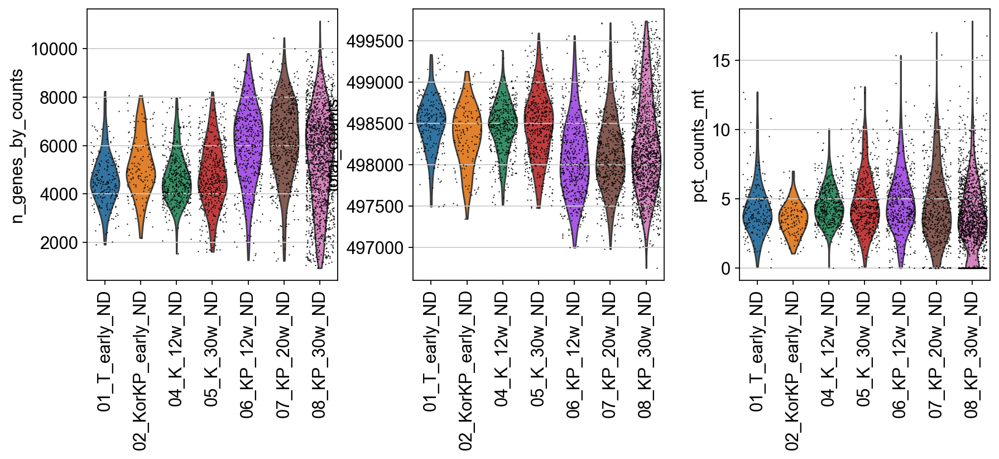

In [12]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, groupby='timesimple',rotation=90)

(array([  10.,   43.,   47.,  100.,  182.,  547.,  979., 1121.,  780.,
          82.]),
 array([0.52252668, 0.54131873, 0.56011077, 0.57890281, 0.59769486,
        0.6164869 , 0.63527894, 0.65407099, 0.67286303, 0.69165507,
        0.71044712]),
 <BarContainer object of 10 artists>)

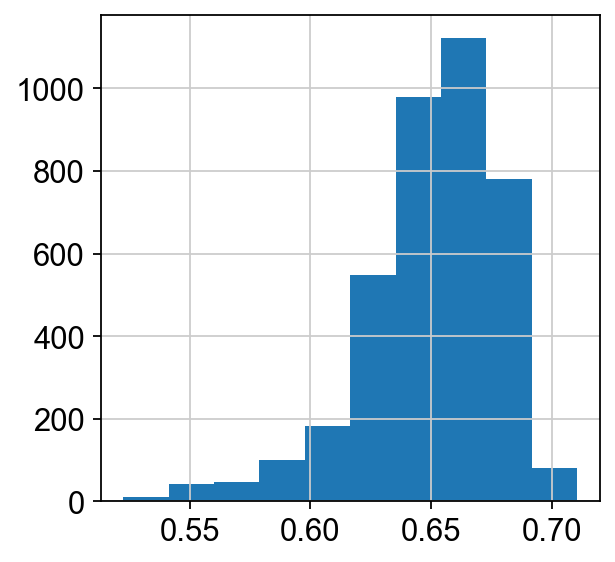

In [13]:
adata.obs["log10GenesPerUMI"] = adata.obs['n_genes_by_counts'].apply(math.log10) / adata.obs['total_counts'].apply(math.log10)
plt.pyplot.hist(adata.obs["log10GenesPerUMI"])

/Users/chanj2/opt/miniconda3/envs/scbackup/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/Users/chanj2/opt/miniconda3/envs/scbackup/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


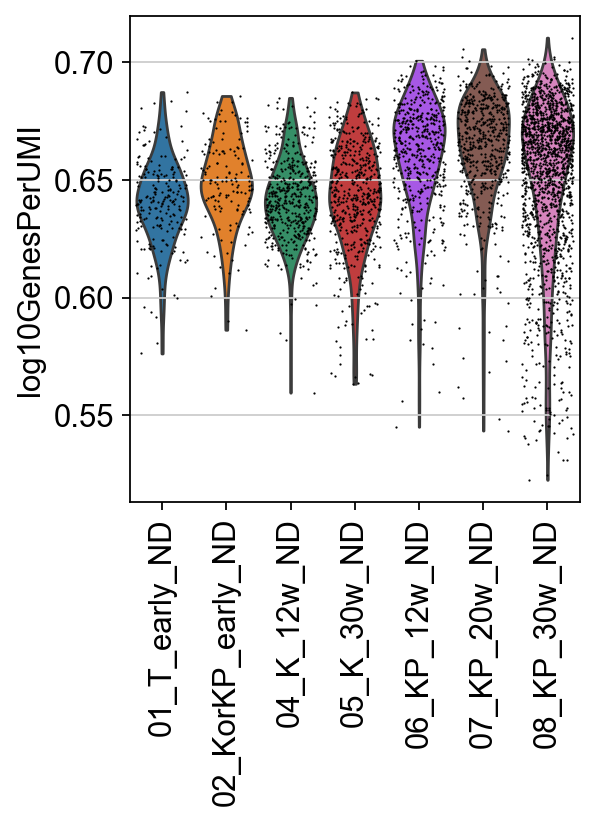

In [14]:
sc.pl.violin(adata, ['log10GenesPerUMI'],
             jitter=0.4, multi_panel=True, groupby='timesimple',rotation=90)
#99% seems like a good Human pct count cutoff

Keep singlets, remove cells that have too many mouse reads, or mitochondrial genes expressed or too many total counts:

In [15]:
#Filter by Log10GenesPerUMI
adata = adata[adata.obs.log10GenesPerUMI >= 0.6,:]

In [16]:
#adata = adata[adata.obs.n_genes_by_counts < 2500, :]
adata = adata[adata.obs.pct_counts_mt <= 10, :]

In [17]:
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


/Users/chanj2/opt/miniconda3/envs/scbackup/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [18]:
adata.layers['counts'] = adata.X.copy()

In [19]:
sc.pp.log1p(adata)

In [20]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=4, min_disp=0.5)

extracting highly variable genes


/Users/chanj2/opt/miniconda3/envs/scbackup/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:226: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby("mean_bin")["dispersions"]


    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


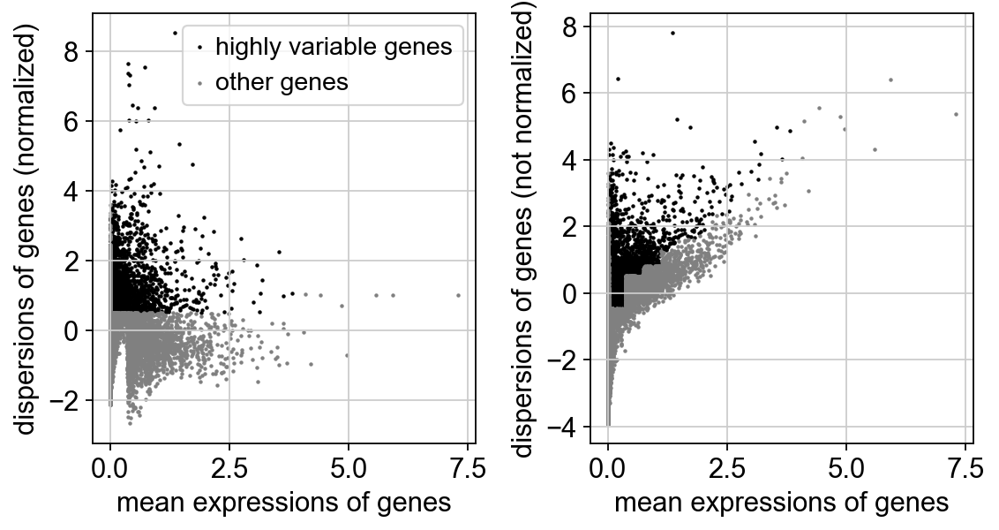

In [21]:
sc.pl.highly_variable_genes(adata)

In [22]:
adata.var.highly_variable['tdTomato'] = False

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_93199/4164286922.py:1: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  adata.var.highly_variable['tdTomato'] = False
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_93199/41

In [23]:
adata.obs.clusterK12

KP_30w_ND_m3_T7_P1_S302           11
KP_30w_ND_m2_T4_P5_S331           12
K_12w_ND_m3_T0_P2_S272             5
KP_30w_ND_m2_T1_P4_S219           10
K_2w_ND_m3_T0_P1_S245              1
                                  ..
KP_20w_STb2_mAdCre1_T1_P2_S377     8
KP_20w_STb2_mAdCre1_T1_P2_S378     9
KP_20w_STb2_mAdCre1_T1_P2_S379     8
KP_20w_STb2_mAdCre1_T1_P2_S380     8
KP_20w_STb2_mAdCre1_T1_P2_S381     8
Name: clusterK12, Length: 3600, dtype: category
Categories (12, int64): [1, 2, 3, 4, ..., 9, 10, 11, 12]

In [24]:
# fix adata.obs.clusterK12 to be a string instead of an int
adata.rename_categories('clusterK12',["%02d" % x for x in range(1, 13)])

In [25]:
adata.obs.clusterK12

KP_30w_ND_m3_T7_P1_S302           11
KP_30w_ND_m2_T4_P5_S331           12
K_12w_ND_m3_T0_P2_S272            05
KP_30w_ND_m2_T1_P4_S219           10
K_2w_ND_m3_T0_P1_S245             01
                                  ..
KP_20w_STb2_mAdCre1_T1_P2_S377    08
KP_20w_STb2_mAdCre1_T1_P2_S378    09
KP_20w_STb2_mAdCre1_T1_P2_S379    08
KP_20w_STb2_mAdCre1_T1_P2_S380    08
KP_20w_STb2_mAdCre1_T1_P2_S381    08
Name: clusterK12, Length: 3600, dtype: category
Categories (12, object): ['01', '02', '03', '04', ..., '09', '10', '11', '12']

In [26]:
adata.raw = adata

In [27]:
adata = adata[:, adata.var.highly_variable]

In [28]:
sc.pp.scale(adata, max_value=10)

/Users/chanj2/opt/miniconda3/envs/scbackup/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


## Principal component analysis

In [29]:
sc.tl.pca(adata, svd_solver='arpack',n_comps=150)

computing PCA
    on highly variable genes
    with n_comps=150
    finished (0:00:07)


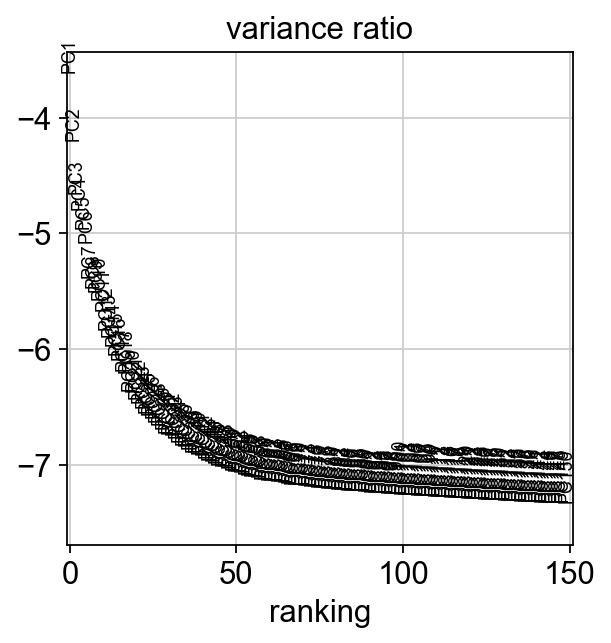

In [30]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=150)

## Computing the neighborhood graph

In [31]:
sc.pp.neighbors(adata, n_neighbors=50, n_pcs=60)

computing neighbors
    using 'X_pca' with n_pcs = 60
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)


## Embedding the neighborhood graph

In [32]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


In [33]:
sc.tl.leiden(adata, resolution=0.5)

running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [34]:
adata

AnnData object with n_obs × n_vars = 3600 × 9007
    obs: 'sampleID', 'plateID', 'mouseID', 'timesimple', 'typeID', 'clusterK12', 'tSNE_1', 'tSNE_2', 'phate_1', 'phate_2', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log10GenesPerUMI', 'leiden'
    var: 'geneID', 'geneSymbol', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'timesimple_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

/Users/chanj2/opt/miniconda3/envs/scbackup/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/scbackup/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/chanj2/opt/miniconda3/envs/scbackup/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector

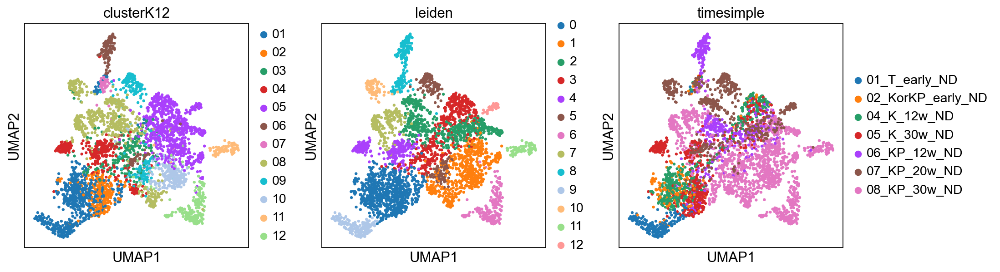

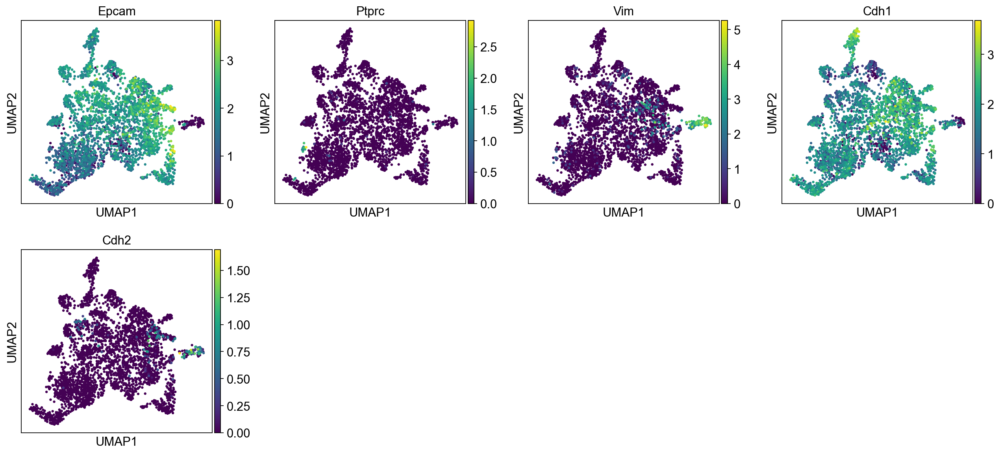

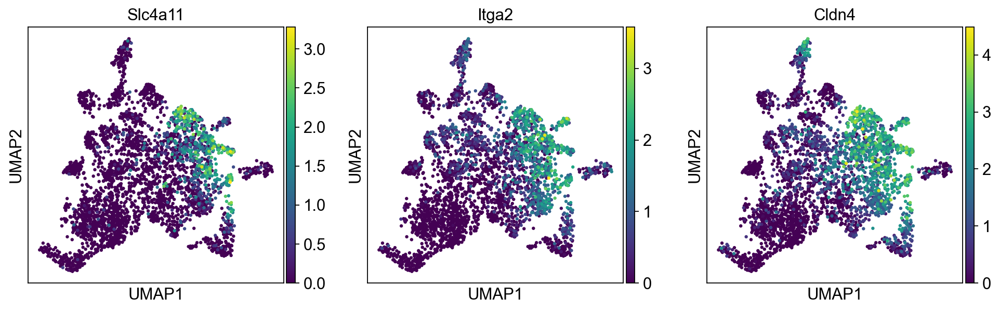

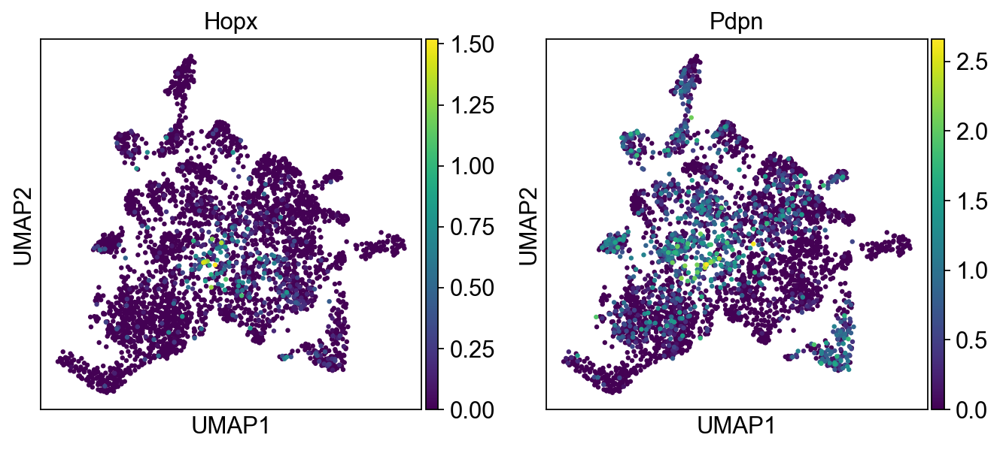

In [35]:
sc.pl.umap(adata, color=['clusterK12', 'leiden','timesimple', ])
sc.pl.umap(adata, color=['Epcam', 'Ptprc', 'Vim', 'Cdh1','Cdh2']) #CDH2 not found
sc.pl.umap(adata, color=['Slc4a11', 'Itga2', 'Cldn4']) #, 'Abcb1'
sc.pl.umap(adata, color=['Hopx', 'Pdpn'])

## Define Scoring Functions

In [36]:
# Score Cluster 5 cells
import csv
clusters = {}
clusterkeys = []
HPCS = False

def resetClusters(hpcs = 'cell2020'):
    clusters = {}
    clusterkeys = []
    HPCS = False
    try:
        if hpcs == 'cell2020':         
            with open('../common_files/clusters_cell2020.csv',encoding='utf-8-sig') as csvfile:
                csvreader = csv.reader(csvfile, delimiter=",")
                for row in csvreader:
                    clusters[row[0]] = [x for x in row[1:] if x != '']
            for i in range(1,13):
                #if i == 9: continue
                clusterkeys.append('Cluster %i' % i)
            HPCS = 'Cluster 5'
        else:
            raise ValueError
    except ValueError:
        print("%s is an invalid choice" % hpcs)
        raise
    return (clusters, clusterkeys, HPCS)

(clusters, clusterkeys, HPCS) = resetClusters('cell2020')

In [37]:
def scoreAndPlot(ad, excludeList = None, groupby="clusterK12",rotation=90,numgenes=25,ctlgenes=25):
    #cmap = 'Reds' #colormap
    cmap = 'jet' #colormap
    if excludeList == None:
        for i in clusterkeys:
            if (numgenes > ctlgenes):
                ctlgenes = numgenes
            sc.tl.score_genes(ad, clusters[i][0:numgenes],score_name="%s" % i, ctrl_size=ctlgenes)
  
        sc.pl.umap(ad, color=clusterkeys, color_map=cmap)
        sc.pl.dotplot(ad, clusterkeys, groupby=groupby, swap_axes=True)

In [38]:
from scipy.stats import ranksums

def HPCSViolinPlot(ad, cluster='0', groupby='leiden', score='Cluster5', save=None, singleGene=False):
    ad.obs['Cl5'] = 'not HPCS'
    ad.obs.loc[ad.obs[groupby].isin([cluster]), 'Cl5'] = 'HPCS'

    if singleGene:
        pvalue = ranksums(ad[ad.obs['Cl5'].isin(['HPCS'])][:,score].X.toarray(),ad[~ad.obs['Cl5'].isin(['HPCS'])][:,score].X.toarray())[1]
    else:
        pvalue = ranksums(ad[ad.obs['Cl5'].isin(['HPCS'])].obs[score],ad[ad.obs['Cl5'].isin(['not HPCS'])].obs[score])[1]
    sc.pl.violin(ad, score, groupby='Cl5', xlabel = 'p = ' + str(pvalue), save=save)

computing score 'Cluster 1'
    finished: added
    'Cluster 1', score of gene set (adata.obs).
    994 total control genes are used. (0:00:00)
computing score 'Cluster 2'
    finished: added
    'Cluster 2', score of gene set (adata.obs).
    892 total control genes are used. (0:00:00)
computing score 'Cluster 3'
    finished: added
    'Cluster 3', score of gene set (adata.obs).
    1194 total control genes are used. (0:00:00)
computing score 'Cluster 4'
    finished: added
    'Cluster 4', score of gene set (adata.obs).
    994 total control genes are used. (0:00:00)
computing score 'Cluster 5'
    finished: added
    'Cluster 5', score of gene set (adata.obs).
    892 total control genes are used. (0:00:00)
computing score 'Cluster 6'
    finished: added
    'Cluster 6', score of gene set (adata.obs).
    1190 total control genes are used. (0:00:00)
computing score 'Cluster 7'
    finished: added
    'Cluster 7', score of gene set (adata.obs).
    1089 total control genes are used.

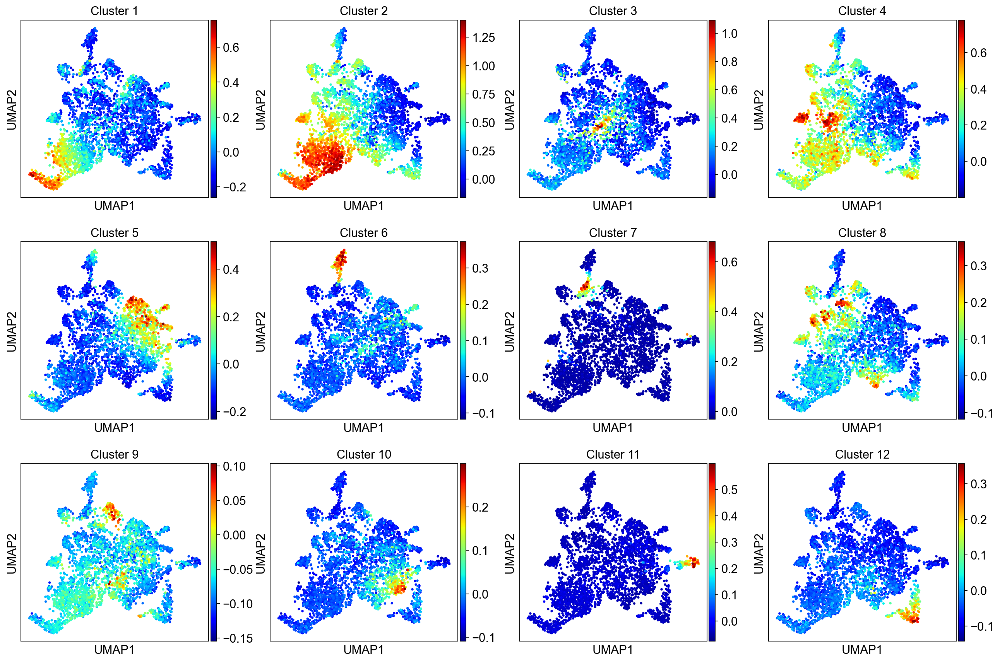

/Users/chanj2/opt/miniconda3/envs/scbackup/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Users/chanj2/opt/miniconda3/envs/scbackup/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Users/chanj2/opt/miniconda3/envs/scbackup/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will b

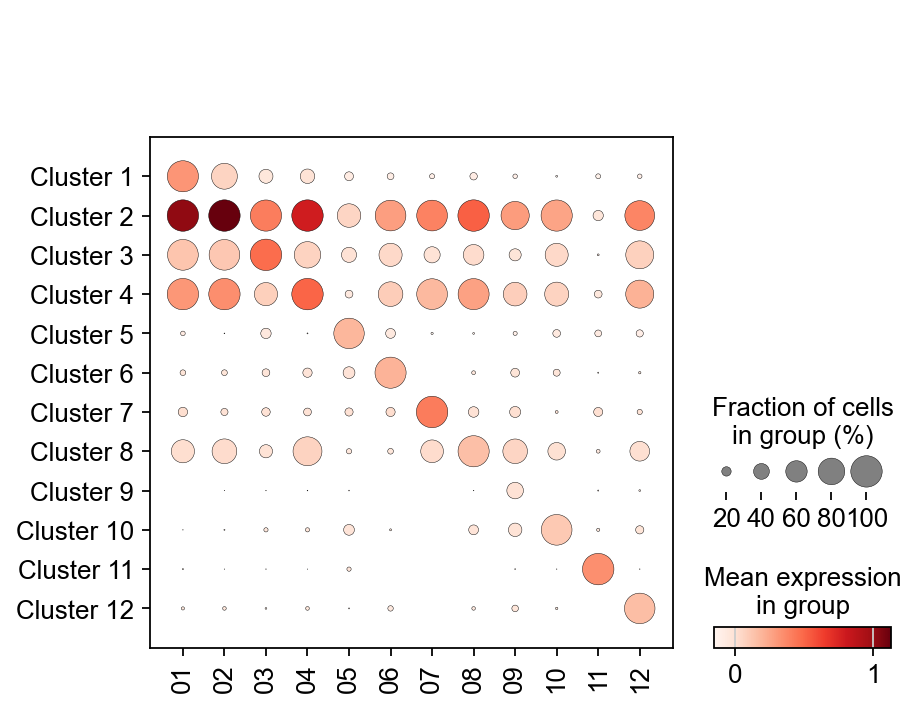

In [39]:
scoreAndPlot(adata,numgenes=100)

## Clustering the neighborhood graph

/Users/chanj2/opt/miniconda3/envs/scbackup/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/scbackup/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


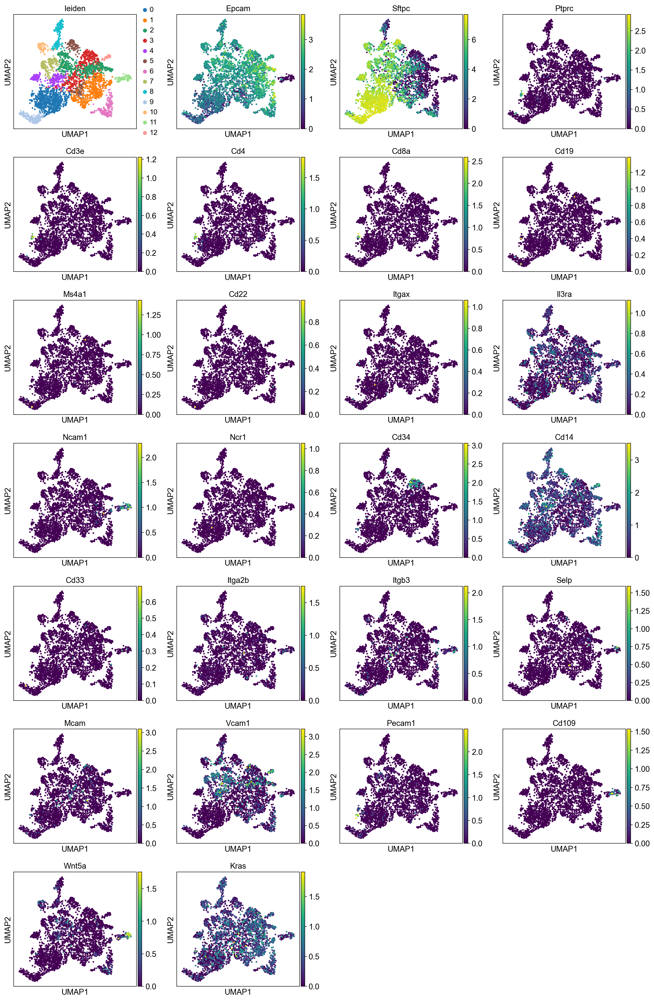

In [40]:
sc.pl.umap(adata, color=['leiden', 'Epcam', 'Sftpc', # Tumor cells
                         'Ptprc', #immune
                         'Cd3e', 'Cd4', 'Cd8a', #T cell
                         'Cd19', 'Ms4a1', 'Cd22', # B cell
                         'Itgax', 'Il3ra', # Dendritic Cell
                         'Ncam1', 'Ncr1', # NK Cell
                         'Cd34', # Hematopoetic stem cell
                         'Cd14', 'Cd33', # macrophage
                         #'Ceacam8' # Granulocyte
                         'Itga2b', 'Itgb3', 'Selp', #platelet
                         #'Gypa',  # erythrocyte
                         'Mcam', 'Vcam1', 'Pecam1', #'Sele', # endothelial cell
                         'Cd109', 'Wnt5a', 'Kras'])

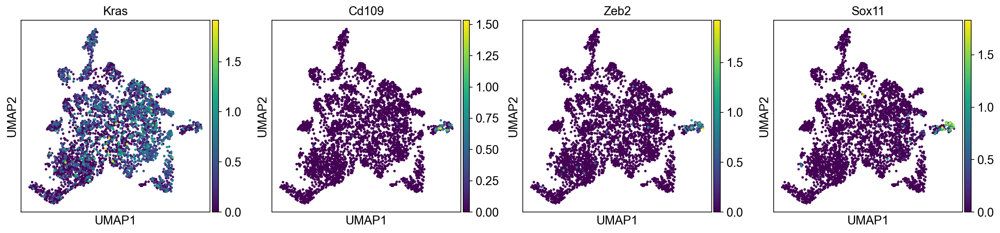

In [41]:
sc.pl.umap(adata, color=['Kras', 'Cd109', 'Zeb2', 'Sox11'])

/Users/chanj2/opt/miniconda3/envs/scbackup/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/scbackup/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


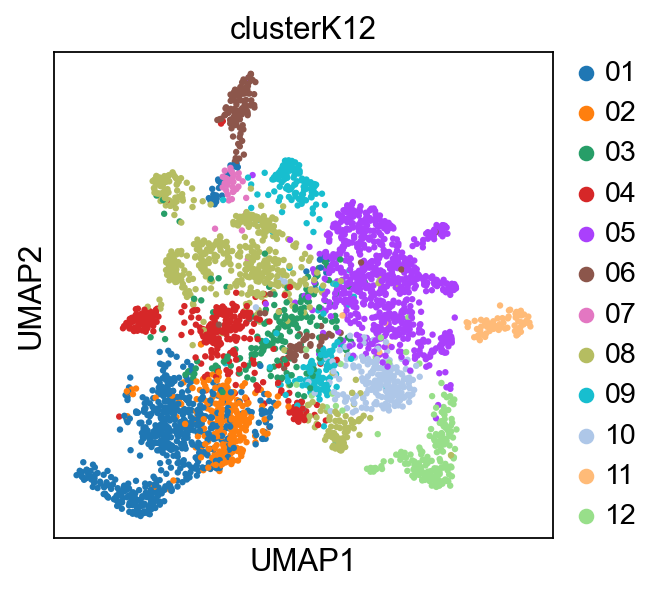

In [42]:
sc.pl.umap(adata, color=['clusterK12'])

## Finding marker genes

## Logistic Regression against Cancer Cell 2020 Clusters

In [43]:
goi = set()
with open('../common_files/clusters_cell2020.csv',encoding='utf-8-sig') as csvfile:
    csvreader = csv.reader(csvfile, delimiter=",")
    for row in csvreader:
        goi.update(row[1:])

In [44]:
goi.remove('')

In [45]:
from sklearn.model_selection import train_test_split

names_adata = adata[:,adata.var.index.isin(goi)]

X_train, X_test, y_train, y_test = train_test_split(names_adata.X, adata.obs['clusterK12'], test_size=0.25, random_state=250)

In [46]:
names = [x for x in names_adata.var.index]

In [47]:
# import the class
from sklearn.linear_model import LogisticRegression

# instantiate the model (using the default parameters)
#logreg = LogisticRegression(random_state=250,multi_class='multinomial',solver='saga')
logreg = LogisticRegression(random_state=250,multi_class='multinomial',solver='lbfgs')

# fit the model with data
logreg.fit(X_train, y_train)

y_pred = logreg.predict(X_test)
y_score = logreg.predict_proba(X_test)


In [48]:
# import the metrics class
from sklearn import metrics

cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix

array([[144,   5,   2,   0,   0,   0,   1,   0,   0,   0,   0,   0],
       [  7,  70,   0,   3,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,  42,   0,   2,   0,   0,   2,   0,   1,   0,   0],
       [  0,   1,   0,  67,   0,   0,   0,   8,   1,   0,   0,   0],
       [  0,   0,   3,   0, 181,   2,   0,   2,   0,   0,   0,   1],
       [  0,   0,   0,   0,   0,  34,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,  15,   0,   0,   0,   0,   0],
       [  0,   0,   1,   2,   1,   0,   0, 138,   1,   0,   0,   1],
       [  0,   0,   0,   1,   1,   0,   0,   1,  38,   1,   0,   0],
       [  0,   0,   1,   0,   0,   0,   0,   3,   0,  58,   0,   1],
       [  0,   0,   0,   0,   0,   0,   0,   0,   1,   0,  13,   0],
       [  0,   0,   0,   0,   1,   0,   0,   0,   1,   1,   0,  40]])

Text(0.5, 295.64444444444445, 'Predicted label')

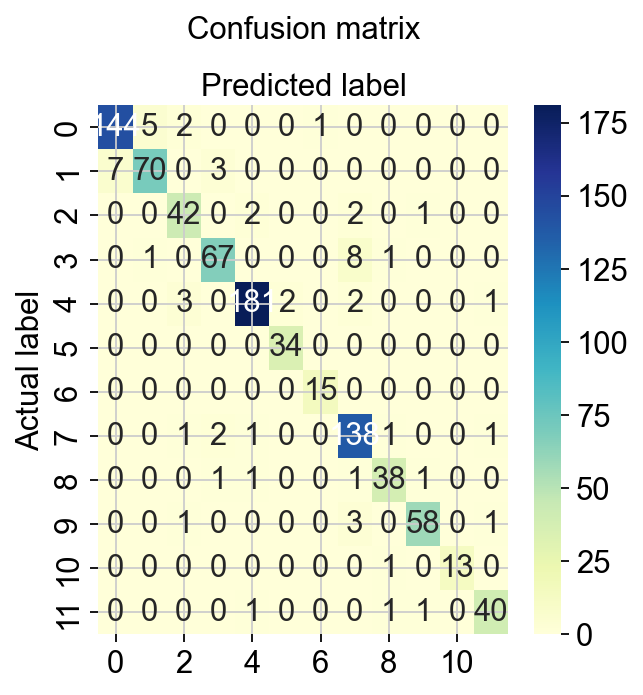

In [49]:
# import required modules
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

#Text(0.5,257.44,'Predicted label');

In [50]:
from sklearn.metrics import classification_report
target_names = ['1', '2', '3','4','5','6','7','8','9','10','11','12']
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

           1       0.95      0.95      0.95       152
           2       0.92      0.88      0.90        80
           3       0.86      0.89      0.88        47
           4       0.92      0.87      0.89        77
           5       0.97      0.96      0.97       189
           6       0.94      1.00      0.97        34
           7       0.94      1.00      0.97        15
           8       0.90      0.96      0.93       144
           9       0.90      0.90      0.90        42
          10       0.95      0.92      0.94        63
          11       1.00      0.93      0.96        14
          12       0.93      0.93      0.93        43

    accuracy                           0.93       900
   macro avg       0.93      0.93      0.93       900
weighted avg       0.93      0.93      0.93       900



In [51]:
from sklearn.preprocessing import LabelBinarizer

label_binarizer = LabelBinarizer().fit(y_train)
y_onehot_test = label_binarizer.transform(y_test)
y_onehot_test.shape  # (n_samples, n_classes)

(900, 12)

In [52]:
label_binarizer.classes_

array(['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11',
       '12'], dtype='<U2')

In [53]:
class_of_interest = '07'
class_id = np.flatnonzero(label_binarizer.classes_ == class_of_interest)[0]
class_id

6

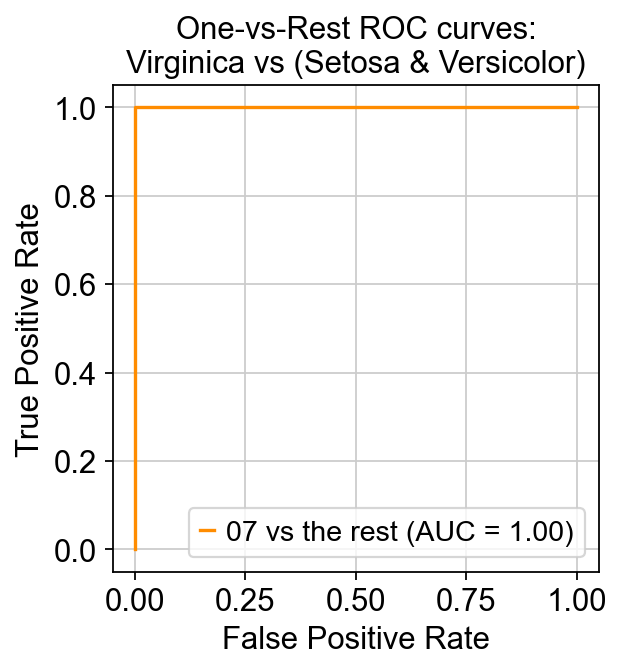

In [54]:
import matplotlib.pyplot as plt

from sklearn.metrics import RocCurveDisplay

RocCurveDisplay.from_predictions(
    y_onehot_test[:, class_id],
    y_score[:, class_id],
    name=f"{class_of_interest} vs the rest",
    color="darkorange",
    #plot_chance_level=True,
)
plt.axis("square")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("One-vs-Rest ROC curves:\nVirginica vs (Setosa & Versicolor)")
plt.legend()
plt.show()

In [55]:
## Now write logit classifier to load later
from joblib import dump, load
#dump(logreg, '../common_files/cancerCell2020Logreg.joblib')
dump(names, '../common_files/genes.joblib')

['../common_files/genes.joblib']

## Logistic Regression against Cancer Cell 2020 Clusters score data

## Plot on PHATE Map Coordinates

In [56]:
# setup coordinate system for PHATE map
adata.obsm['X_phate'] = adata.obs[['phate_1','phate_2']].values

## Write h5ad file

In [57]:
adata.write(results_file, compression='gzip')

## For Revision

In [105]:
from pathlib import Path

In [106]:
Path("./figures").mkdir(parents=True, exist_ok=True) # generate figures here

In [107]:
adata.obs['Slc4a11_obs'] = [1 if x else 0 for x in adata[:,'Slc4a11'].X != adata[:,'Slc4a11'].X.min()]

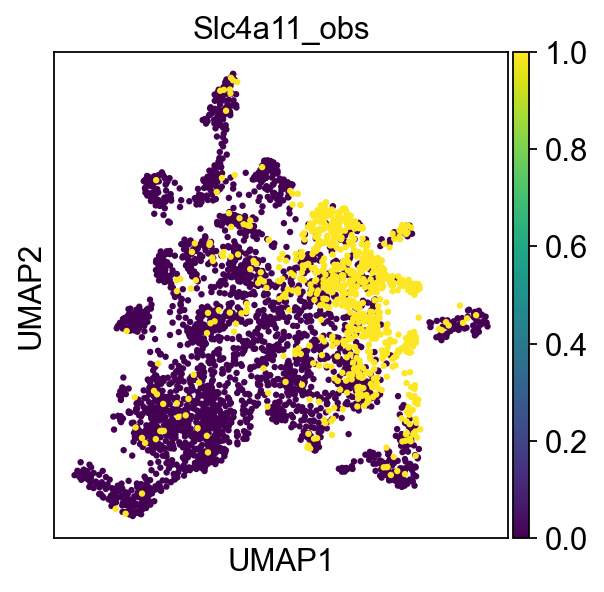

In [108]:
sc.pl.umap(adata, color=['Slc4a11_obs'])

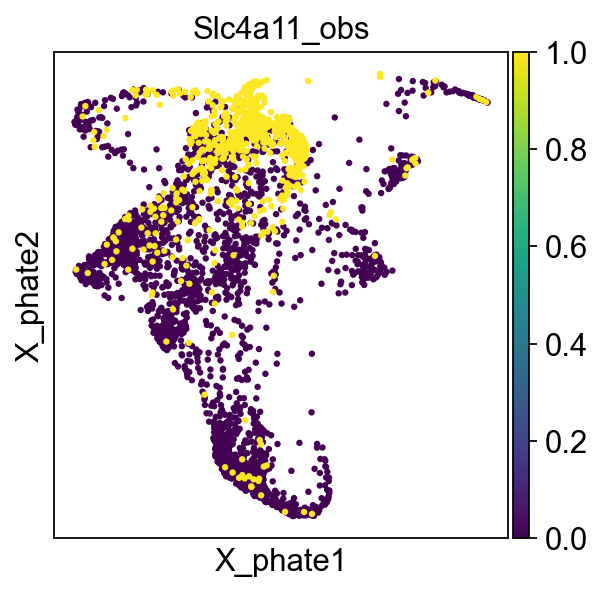

In [109]:
sc.pl.embedding(adata, color=['Slc4a11_obs'],basis='X_phate')

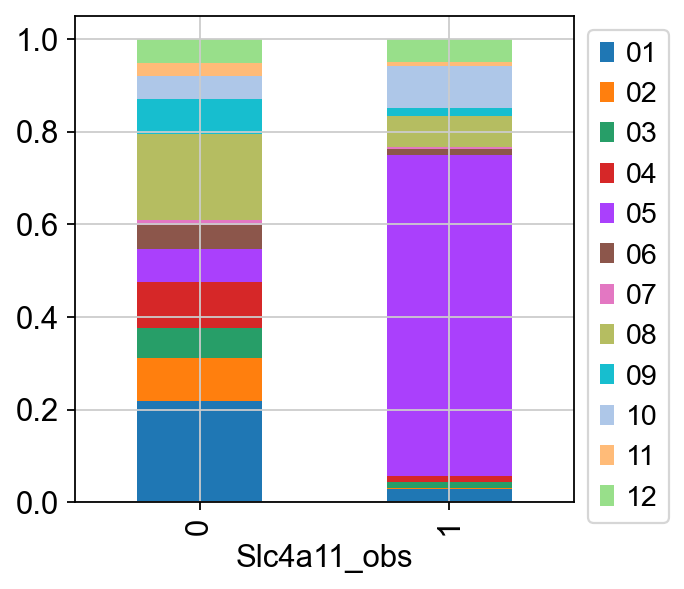

In [110]:
 cell_proportion_df = pd.crosstab(adata.obs['clusterK12'],adata.obs['Slc4a11_obs'], normalize='columns').T.plot(kind='bar', stacked=True).legend(bbox_to_anchor=(1,1))

In [111]:
cell_proportion_df.get_figure().savefig('figures/Revision_1_cell_proportion_Marjanovic.svg')

In [112]:
pd.crosstab(adata.obs['clusterK12'],adata.obs['Slc4a11_obs'], normalize='columns')

Slc4a11_obs,0,1
clusterK12,,
01,0.217624,0.028858
02,0.094185,0.002509
03,0.063503,0.012547
04,0.101320,0.012547
05,0.069212,0.693852
06,0.051730,0.012547
07,0.011060,0.003764
08,0.185516,0.067754
09,0.075633,0.016311


In [117]:
pd.crosstab(adata.obs['clusterK12'],adata.obs['Slc4a11_obs']).sum()

Slc4a11_obs
0    2803
1     797
dtype: int64

In [118]:
pd.crosstab(adata.obs['clusterK12'],adata.obs['Slc4a11_obs'])

Slc4a11_obs,0,1
clusterK12,,
01,610,23
02,264,2
03,178,10
04,284,10
05,194,553
06,145,10
07,31,3
08,520,54
09,212,13


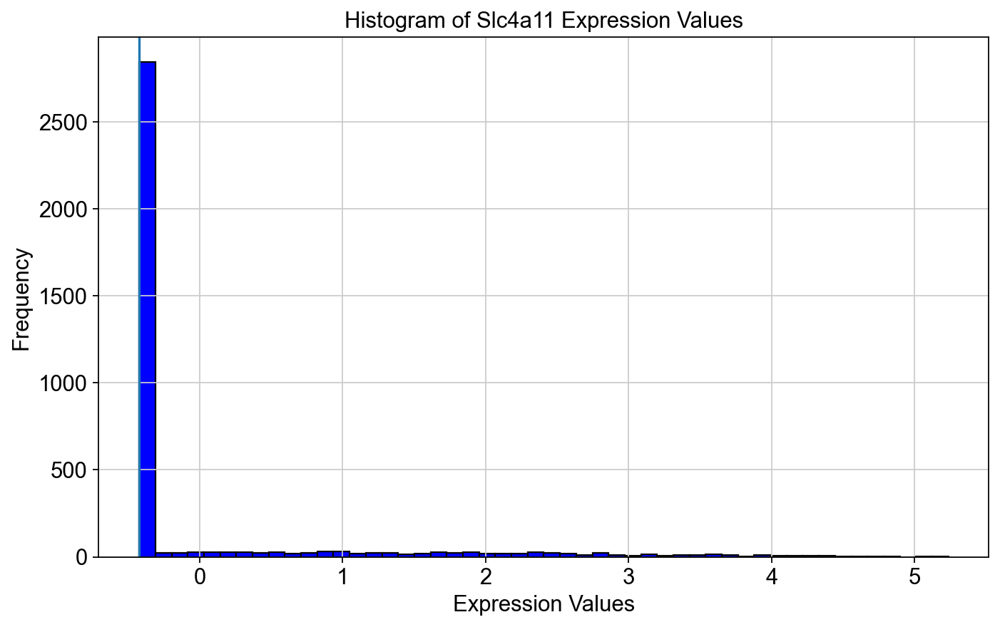

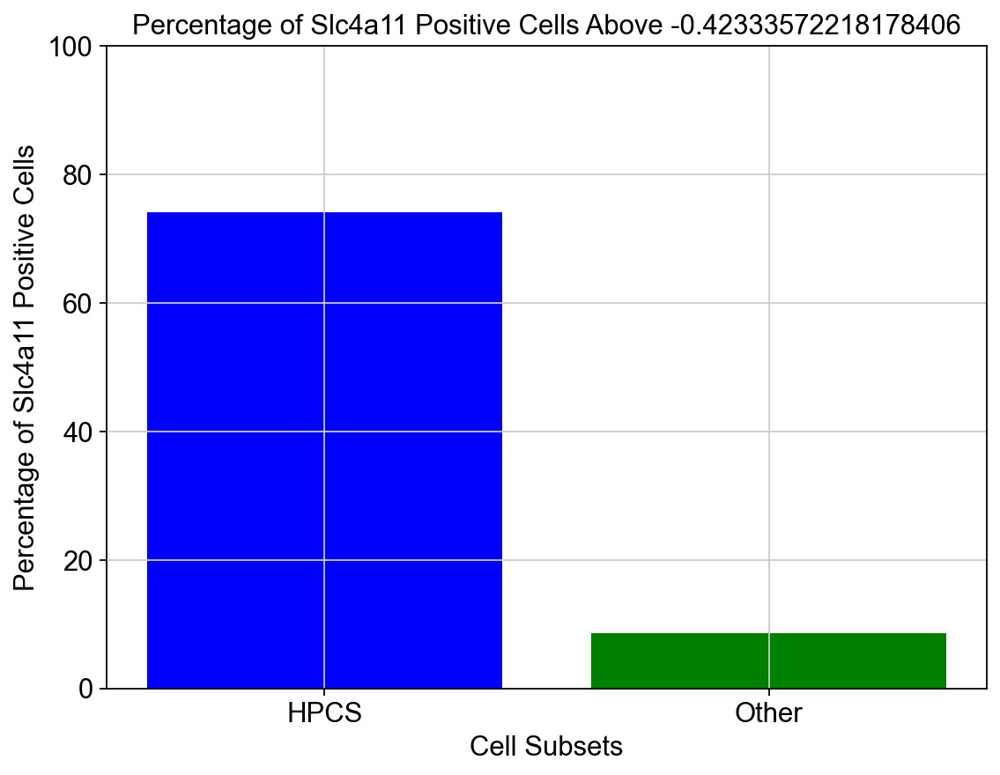

SignificanceResult(statistic=30.47948707115092, pvalue=7.967162376359509e-281)

In [114]:
gene = 'Slc4a11'
expression_values = adata[:, gene].X
threshold = adata[:,'Slc4a11'].X.min()

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(expression_values, bins=50, color='blue', edgecolor='black')
plt.axvline(x=threshold)
plt.xlabel('Expression Values')
plt.ylabel('Frequency')
plt.title(f'Histogram of {gene} Expression Values')
plt.show()

# Bar Graph

subset_a = adata[adata.obs['clusterK12'] == '05',:]
subset_b = adata[adata.obs['clusterK12'] != '05',:]

# Extract the expression values for the gene for each subset
expression_values_a = subset_a[:, gene].X
expression_values_b = subset_b[:, gene].X

# Calculate the percentage of cells with expression values above the threshold
percent_a = (expression_values_a > threshold).sum() / len(expression_values_a) * 100
percent_b = (expression_values_b > threshold).sum() / len(expression_values_b) * 100

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(['HPCS', 'Other'], [percent_a, percent_b], color=['blue', 'green'])
plt.xlabel('Cell Subsets')
plt.ylabel(f'Percentage of {gene} Positive Cells')
plt.title(f'Percentage of {gene} Positive Cells Above {threshold}')
plt.ylim(0, 100)
plt.savefig(f'figures/Revision_1_{gene}_positive_cells_percentage_Marjanovic.svg')
plt.show()

# calculate statistics
from scipy.stats import fisher_exact
table = [[(expression_values_a > threshold).sum(), (expression_values_a <= threshold).sum()],
        [(expression_values_b > threshold).sum(), (expression_values_b <= threshold).sum()]]
fisher_exact(table)